# September 19-27, 2022: Verify collecting trial level responses
This is to check whether I am collecting the beta coefficients of the stimuli from the unassumed shape analysis done in AFNI.

In [1]:
import os 
import sys
from os.path import join as pjoin
import numpy as np
import scipy as sp
import pandas as pd
from tqdm.notebook import tqdm
import pickle, random
import csv
from copy import deepcopy

# main dirs
proj_dir = pjoin(os.environ['HOME'], 'network_dynamics')
results_dir = f"{proj_dir}/results"
month_dir = f"{proj_dir}/nb/sep22"

# plotting
import matplotlib as mpl
import matplotlib.pyplot as plt
plt.rcParamsDefault['font.family'] = "sans-serif"
plt.rcParamsDefault['font.sans-serif'] = "Arial"
plt.rcParams['font.size'] = 14
plt.rcParams["errorbar.capsize"] = 0.5

import cmasher as cmr #CITE ITS PAPER IN YOUR MANUSCRIPT

# folders
sys.path.insert(0, proj_dir)
import helpers.dataset_utils_v1 as dataset_utils

In [2]:
def get_max_rois(args):
    args.rois_df = pd.read_csv(
        f"/home/govindas/parcellations/MAX_85_ROI_masks/README_MAX_ROIs_final_gm_85.txt",
        delimiter='\t'
    )
    args.rois_df = args.rois_df.sort_values(by=['Schaefer_network'])
    args.roi_idxs = args.rois_df.index.values
    args.roi_names = (args.rois_df['Hemi'] + ' ' + args.rois_df['ROI']).values
    args.nw_names = (args.rois_df['Schaefer_network']).values
    args.num_rois = len(args.roi_names)

    return args

def get_mashid_rois(args):
    args.rois_df = pd.read_csv(
        f"{proj_dir}/data/rois/mashid/roi_set_mashid.csv",
        delimiter=','
    )
    # args.rois_df = args.rois_df.sort_values(by=['network'])
    args.roi_idxs = args.rois_df.index.values
    args.roi_names = (args.rois_df['roi_name']).values
    args.nw_names = (args.rois_df['network']).values
    args.num_rois = len(args.roi_names)

    return args

def get_mashid_plot_tick_labels(args):
    '''
    plotting tick labels
    '''
    ticks = []
    for nw in np.unique(args.nw_names):
        ticks.append(np.where(args.nw_names == nw)[0].shape[0])
    args.ticks = np.array(ticks)[[1, 0, 3, 2]]
    print(args.ticks)

    minor_ticks = np.cumsum(args.ticks)
    args.major_ticks = minor_ticks - args.ticks // 2
    args.minor_ticks = minor_ticks[:-1]
    print(args.minor_ticks)
    print(args.major_ticks)

    args.major_tick_labels = np.unique(args.nw_names)[[1, 0, 3, 2]]
    print(args.major_tick_labels)

    return args

## MAX dataset

In [3]:
class ARGS(): pass
args = ARGS()

args.SEED = 74
np.random.seed(args.SEED)

args.LABEL_NAMES = ['FNT', 'FNS']
args.NAMES = ['Threat', 'Safe']
args.TRIAL_LEN = 14
args.TR = 1.25 #seconds
EARLY = np.arange(2.5, 8.75+args.TR, args.TR) // args.TR
LATE = np.arange(10.0, 16.25+args.TR, args.TR) // args.TR
EARLY = EARLY.astype(int)
LATE = LATE.astype(int)
args.PERIOD_TRS = {'late': LATE, 'early': EARLY}

### MAX ROIs

  0%|          | 0/27 [00:00<?, ?it/s]

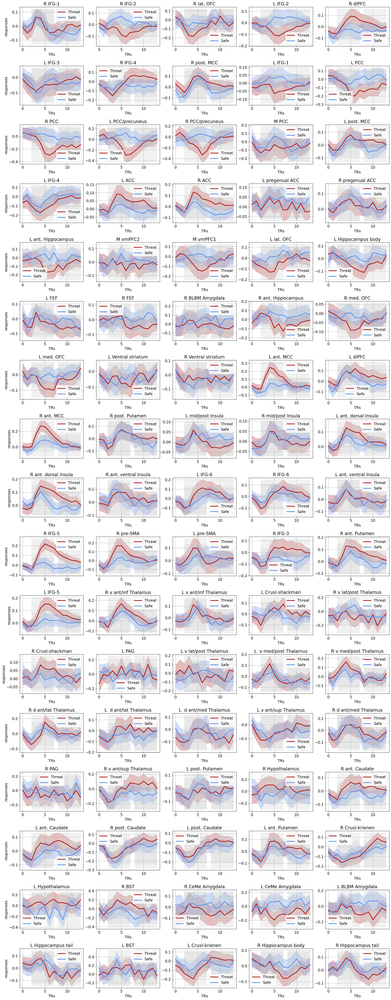

In [4]:
args.roi_set_name = 'max'
args.main_data_dir = (
    f"{proj_dir}/data/max/neutral_runs_trial_level_FNSandFNT/{args.roi_set_name}"
)
# exploratory data
args.subjects = os.listdir(args.main_data_dir)
random.Random(args.SEED).shuffle(args.subjects)
args.explor_subjects = args.subjects[ : round(0.25 * len(args.subjects))]

# ROIs
args = get_max_rois(args)

# condition responses
X = dataset_utils.get_max_trial_level_responses(args)
for name in X.keys():
    for idx_subj in range(len(X[name])):
        X[name][idx_subj] = X[name][idx_subj][:, :, args.roi_idxs]

# ts = dataset_utils.get_max_block_time_series(args, X)

args.plot_colors = {'Threat': 'firebrick', 'Safe': 'cornflowerblue'}
dataset_utils.plot_max_responses(args, X)

### Mashid ROIs

[13 12 12  8]
[13 25 37]
[ 7 19 31 41]
['Salience' 'Executive' 'Task negative' 'Subcortical']


  0%|          | 0/27 [00:00<?, ?it/s]

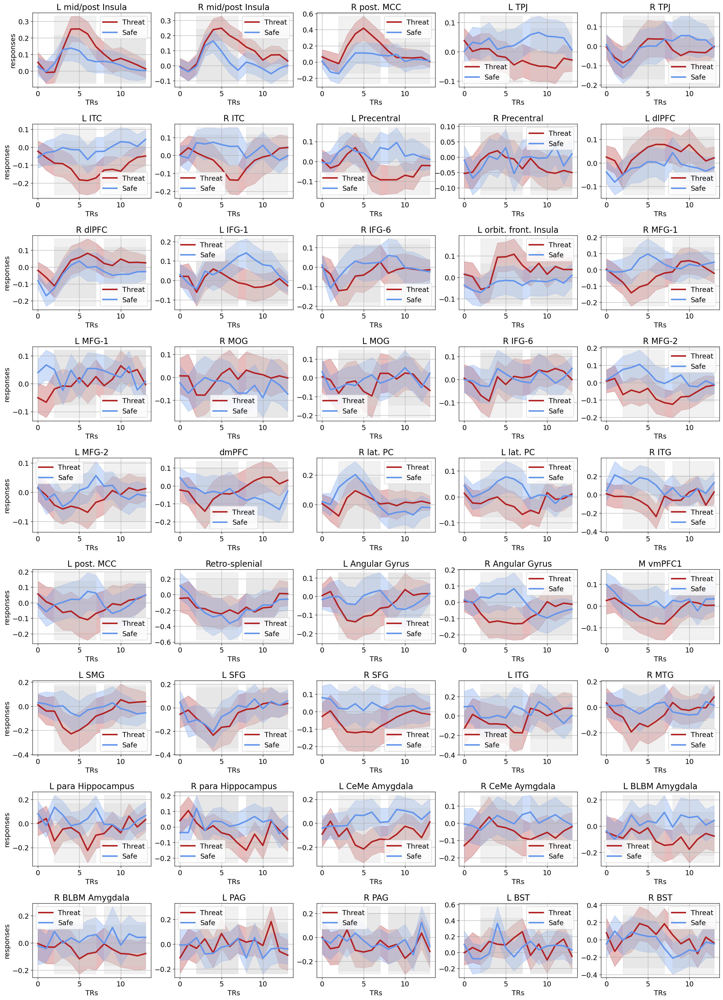

In [5]:
args.roi_set_name = 'mashid'
args.main_data_dir = (
    f"{proj_dir}/data/max/neutral_runs_trial_level_FNSandFNT/{args.roi_set_name}"
)
# exploratory data
args.subjects = os.listdir(args.main_data_dir)
random.Random(args.SEED).shuffle(args.subjects)
args.explor_subjects = args.subjects[ : round(0.25 * len(args.subjects))]

# ROIs
args = get_mashid_rois(args)
args = get_mashid_plot_tick_labels(args)

# condition responses
X = dataset_utils.get_max_trial_level_responses(args)
for name in X.keys():
    X[name] = [x for x in X[name] if x.shape[-1] == args.num_rois if x.shape[0] > 11]
    for idx_subj in range(len(X[name])):
        X[name][idx_subj] = X[name][idx_subj][:, :, args.roi_idxs]
args.plot_colors = {'Threat': 'firebrick', 'Safe': 'cornflowerblue'}
dataset_utils.plot_max_responses(args, X)

#### FCs

##### concatenate trials along time axis

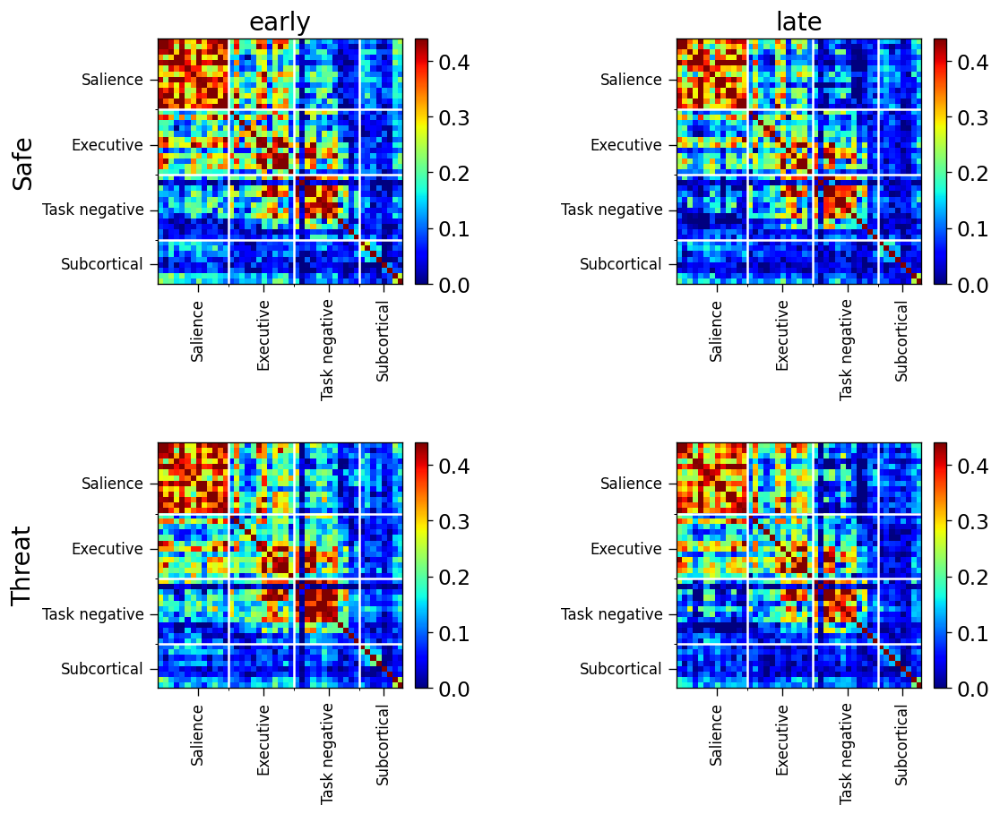

In [6]:
ts = dataset_utils.get_max_block_time_series(args, X, trial_option='concat')
fcs, summary_fcs = dataset_utils.get_fcs(args, ts)
dataset_utils.plot_max_fcs(args, summary_fcs, cmap=mpl.colormaps['jet'])

##### average responses over time

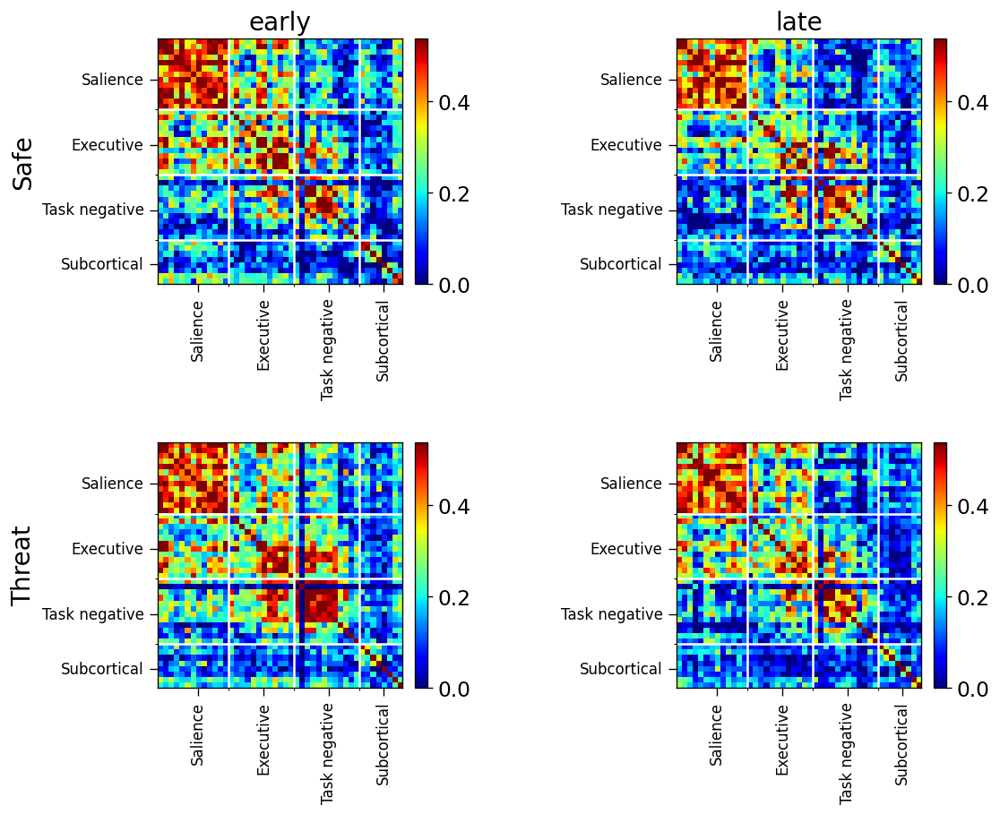

In [7]:
ts = dataset_utils.get_max_block_time_series(args, X, trial_option='mean')
fcs, summary_fcs = dataset_utils.get_fcs(args, ts)
dataset_utils.plot_max_fcs(args, summary_fcs, cmap=mpl.colormaps['jet'])

In [87]:
ensure_symmetry = lambda fc: (fc + fc.T)/2
summary_fcs = {}
args.eps = 1e-3
for block in fcs.keys():
    log_fc = np.zeros_like(fcs[block][0])
    for fc in fcs[block]:
        fc = ensure_symmetry(fc)
        evecs, evals = np.linalg.eig(fc) # full_matrices=True)
        evals += args.eps * (evals < args.eps) # lift very small eigenvalues
        
    #     log_fc += (evecs @ np.diag(np.log(evals)) @ evecs.T)
    
    # evecs, evals, _ = np.linalg.svd(log_fc / len(fcs[block]))
    # summary_fcs[block] = (evecs @ np.diag(np.exp(evals)) @ evecs.T)

In [88]:
evals

array([[-0.18615127+0.j        , -0.03000041+0.j        ,
         0.22310283+0.j        , ...,  0.10649893+0.0049268j ,
         0.10649893-0.0049268j ,  0.09900597+0.j        ],
       [-0.17783737+0.j        , -0.21277365+0.j        ,
         0.05768554+0.j        , ..., -0.01864297-0.00861887j,
        -0.01864297+0.00861887j, -0.00078884+0.j        ],
       [-0.20354973+0.j        ,  0.02546015+0.j        ,
         0.17340555+0.j        , ..., -0.07744731-0.00613954j,
        -0.07744731+0.00613954j, -0.04980793+0.j        ],
       ...,
       [-0.14880682+0.j        , -0.06260616+0.j        ,
        -0.1702532 +0.j        , ..., -0.08470022-0.01922953j,
        -0.08470022+0.01922953j, -0.07408932+0.j        ],
       [-0.18240151+0.j        ,  0.1596072 +0.j        ,
         0.135072  +0.j        , ..., -0.07516147+0.00233316j,
        -0.07516147-0.00233316j, -0.0480041 +0.j        ],
       [-0.13186247+0.j        ,  0.11860529+0.j        ,
         0.09033842+0.j       

#### Songtao's independently computed FCs

In [8]:
with open(f"/home/govindas/network_dynamics/data/max/songtao_verification/corrcoef_concat.pkl", 'rb') as f:
    songtao_fcs_concat = pickle.load(f)

with open(f"/home/govindas/network_dynamics/data/max/songtao_verification/corrcoef_mean.pkl", 'rb') as f:
    songtao_fcs_mean = pickle.load(f)

In [9]:
def get_min_max(d):
    '''
    min and max values of the matrices:
    used in plotting the matrices
    '''
    vals = []
    for block in d.keys():
        vals.append(d[block])
    vals = np.concatenate(vals, axis=0).flatten()
    vmin = np.nanquantile(vals, q=0.05)
    vmax = np.nanquantile(vals, q=0.95)
    return -max(-vmin, vmax), max(-vmin, vmax)

def plot_max_fcs_songtao(args, fcs, cmap=cmr.iceburn): 
    vmin, vmax = get_min_max(fcs)

    nrows, ncols = len(args.NAMES), len(args.PERIOD_TRS)
    fig, axs = plt.subplots(
        nrows=nrows, 
        ncols=ncols, 
        figsize=(5*ncols, 4*nrows), 
        sharex=False, 
        sharey=False, 
        dpi=120
    )

    plt.subplots_adjust(
        left=None, bottom=None, 
        right=None, top=None, 
        wspace=0.65, hspace=0.65
    )

    for label, name in enumerate(['FNS', 'FNT'][::-1]):
        for idx_period, period in enumerate(['early', 'late'][::-1]):
            ax = axs[label, idx_period]
            block = f"{period}_{name}"

            # if block == 'safe_early': continue

            im = ax.imshow(
                fcs[block], #* rois[block], 
                cmap=cmap, 
                # vmin=vmin, vmax=vmax
                vmin=0.0, vmax=vmax
            )
            ax.figure.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

            if label == 0: ax.set_title(f"{period}")
            if idx_period == 0: ax.set_ylabel(f"{name}", size='large')
            
            ax.set_yticks(args.major_ticks, args.major_tick_labels, rotation=0, va='center')
            ax.set_xticks(args.major_ticks, args.major_tick_labels, rotation=90, ha='center')

            ax.set_yticks(args.minor_ticks-0.5, minor=True)
            ax.set_xticks(args.minor_ticks-0.5, minor=True)
            ax.tick_params(
                which='major', direction='out', length=5.5, 
                # grid_color='white', grid_linewidth='1.5',
                labelsize=10,
            )
            ax.grid(which='minor', color='w', linestyle='-', linewidth=1.5)

    return None

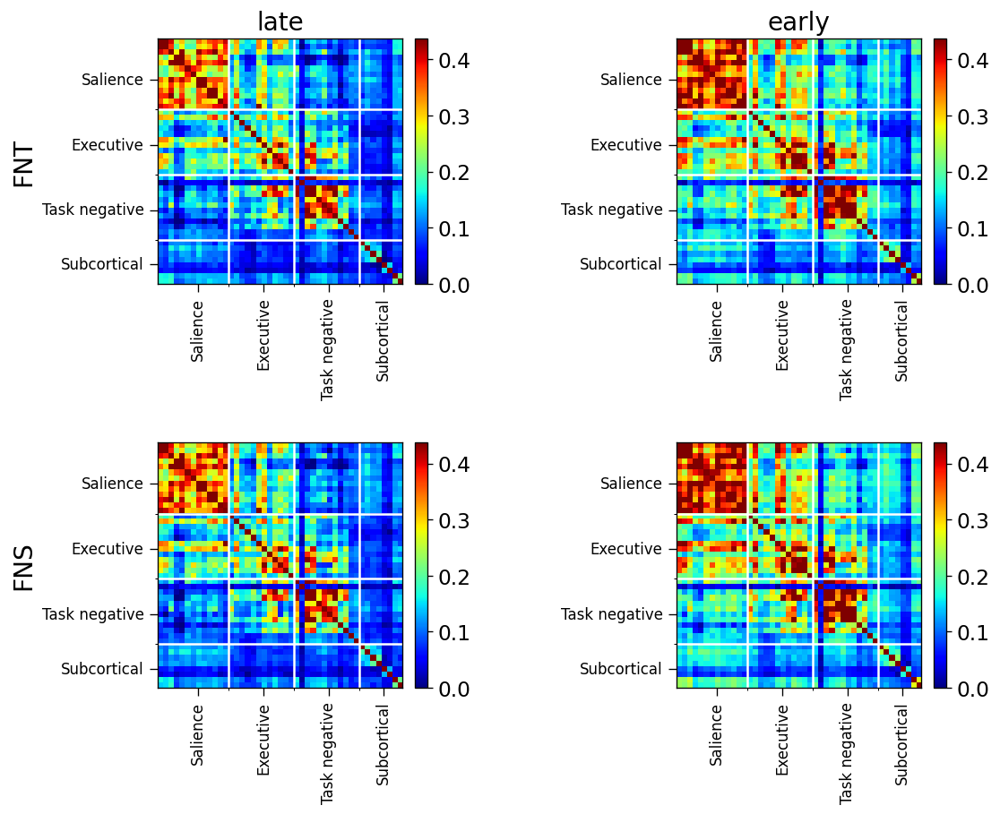

In [10]:
# trials concatenated responses
plot_max_fcs_songtao(args, songtao_fcs_concat, cmap=mpl.colormaps['jet'])

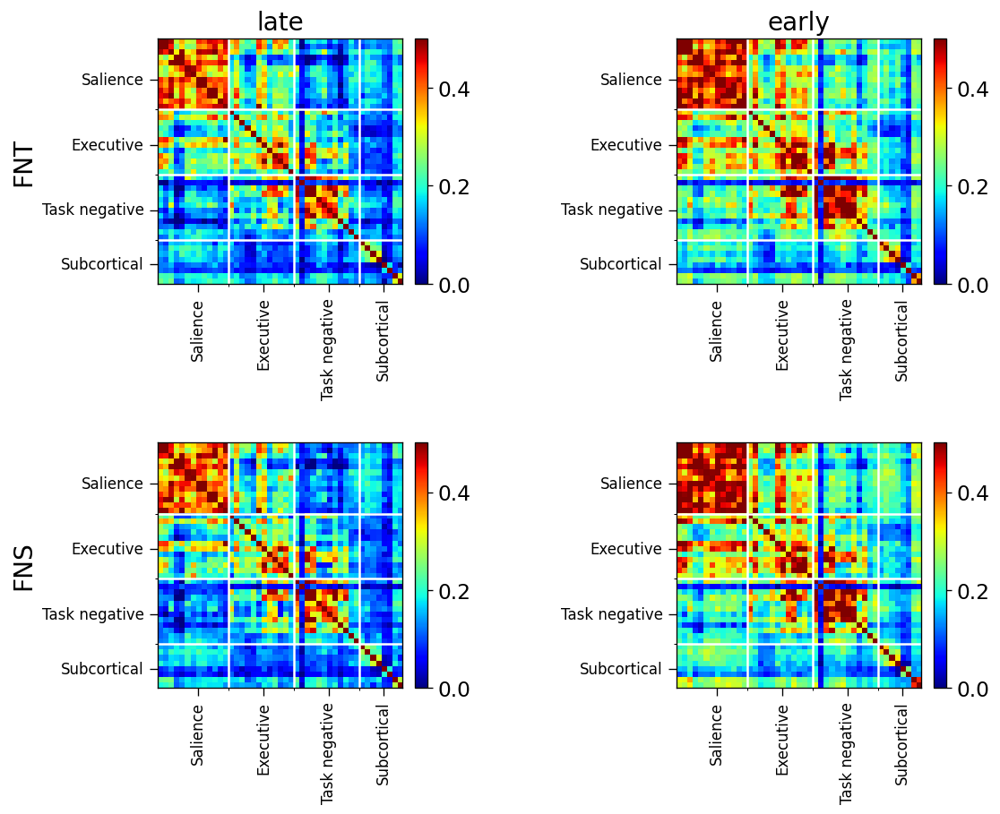

In [11]:
# time averaged responses
plot_max_fcs_songtao(args, songtao_fcs_mean, cmap=mpl.colormaps['jet'])

## ABA dataset

In [12]:
class ARGS(): pass
args = ARGS()

args.SEED = 74
np.random.seed(args.SEED)

args.LABEL_NAMES = ['highT', 'lowT', 'highR', 'lowR']
args.NAMES = ['high_Threat', 'low_Threat', 'high_Reward', 'low_Reward']
args.TRIAL_LEN = 13
args.TR = 1.25
LATE = (np.arange(-3.75, 1.25+args.TR, args.TR) // args.TR + 8.0).astype(int)
args.PERIOD_TRS = {'late': LATE}

### Mashid ROIs

[13 12 12  8]
[13 25 37]
[ 7 19 31 41]
['Salience' 'Executive' 'Task negative' 'Subcortical']


  0%|          | 0/22 [00:00<?, ?it/s]

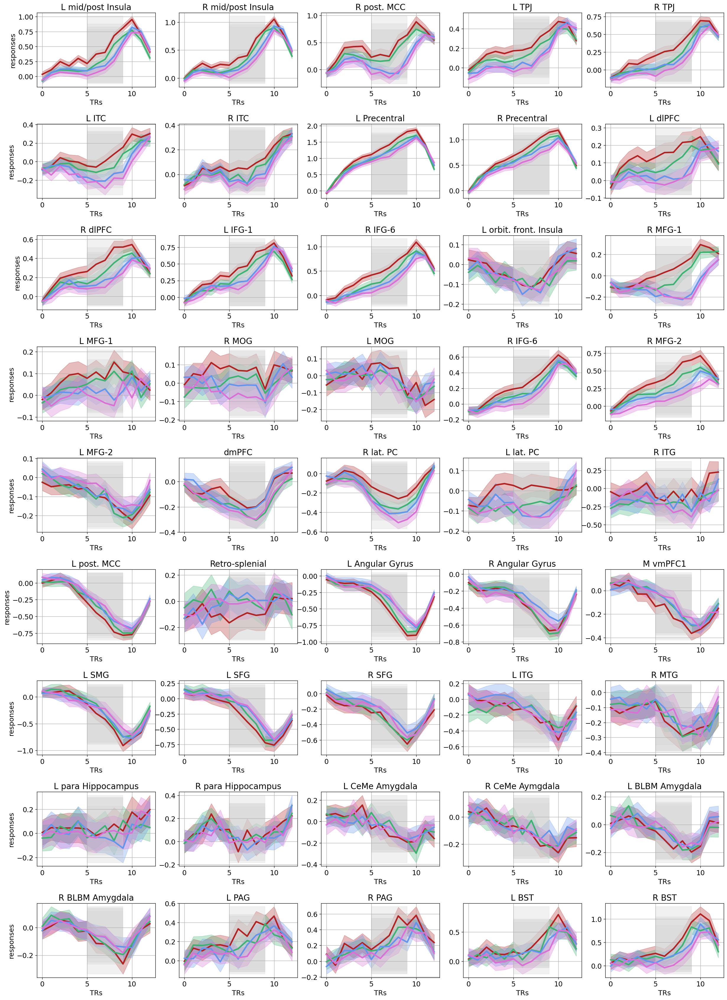

In [13]:
args.roi_set_name = 'mashid'
args.main_data_dir = (
    f"{proj_dir}/data/aba/data/ROI_trialwise_13TR_4plays_offset_reducedRuns/unassumed/rois-{args.roi_set_name}"
)
# exploratory data
args.subjects = os.listdir(args.main_data_dir)
random.Random(args.SEED).shuffle(args.subjects)
args.explor_subjects = args.subjects[ : round(0.25 * len(args.subjects))]

# ROIs
args = get_mashid_rois(args)
args = get_mashid_plot_tick_labels(args)

# condition responses
X = dataset_utils.get_aba_trial_level_responses(args)
args.plot_colors = {
    'high_Threat': 'firebrick', 'low_Threat': 'mediumseagreen', 
    'high_Reward': 'cornflowerblue', 'low_Reward': 'orchid'
}
dataset_utils.plot_aba_responses(args, X)

#### FCs

##### concatenate trials along time axis

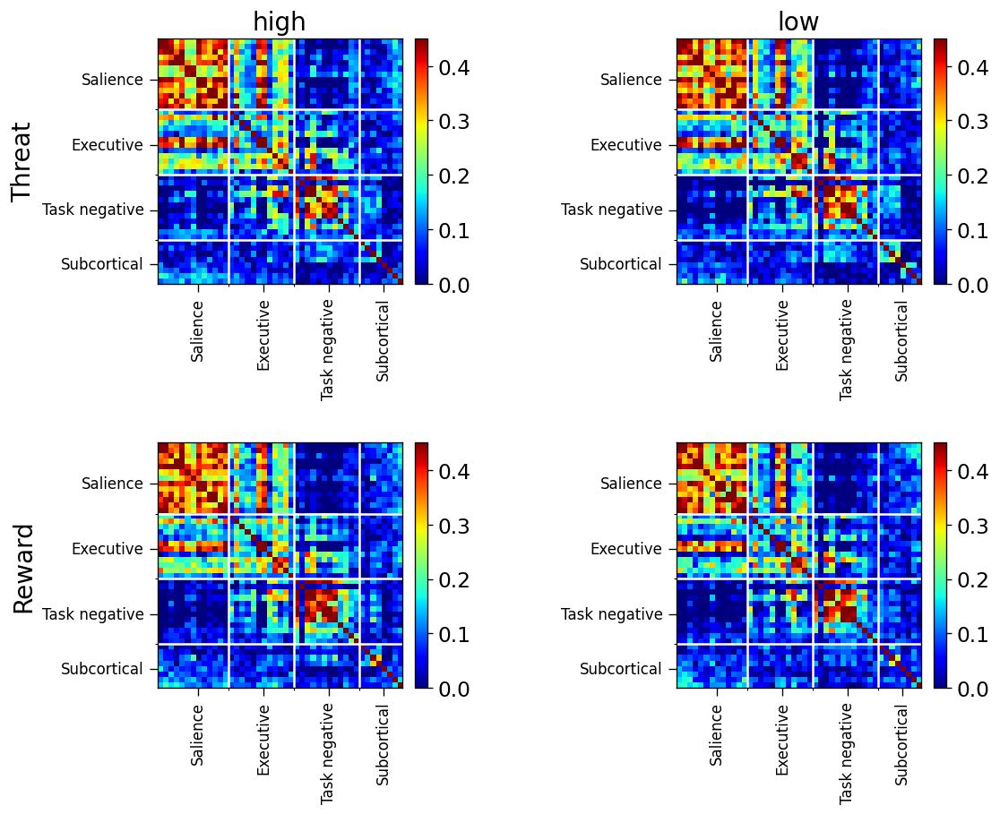

In [14]:
ts = dataset_utils.get_aba_block_time_series(args, X, trial_option='concat')
fcs, summary_fcs = dataset_utils.get_fcs(args, ts)
dataset_utils.plot_aba_fcs(args, summary_fcs, cmap=mpl.colormaps['jet'])

##### average responses over time

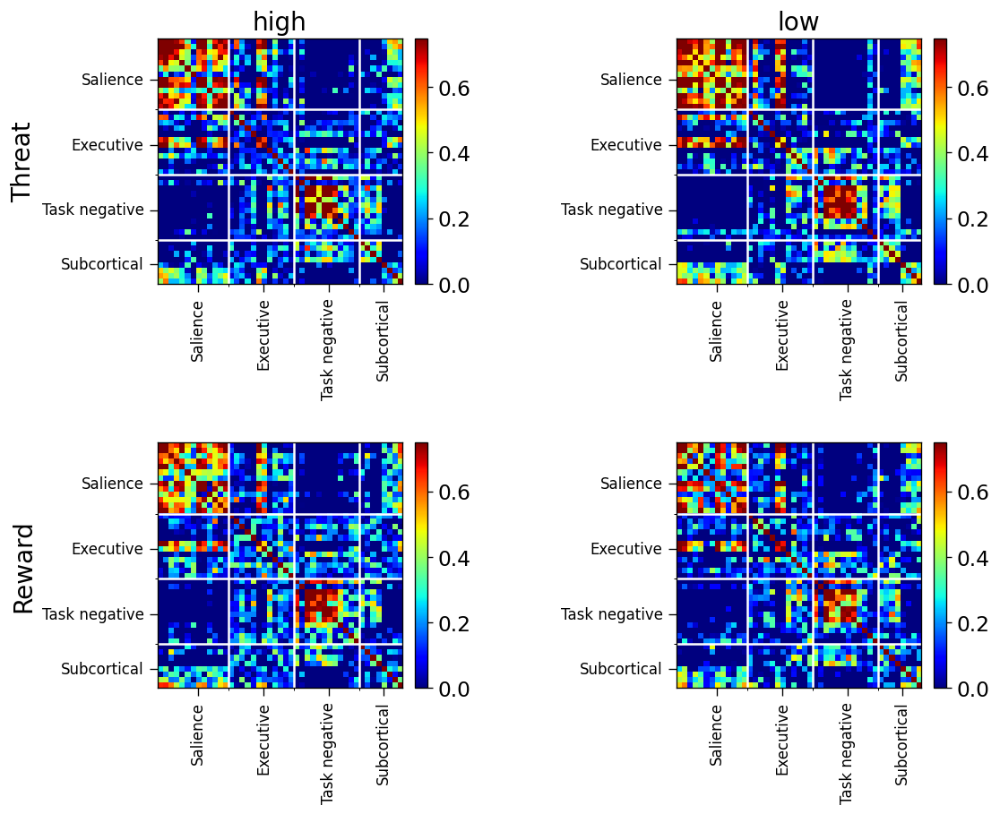

In [15]:
ts = dataset_utils.get_aba_block_time_series(args, X, trial_option='mean')
fcs, summary_fcs = dataset_utils.get_fcs(args, ts)
dataset_utils.plot_aba_fcs(args, summary_fcs, cmap=mpl.colormaps['jet'])

### ABA ROIs

In [16]:
args.roi_set_name = 'aba'
args.main_data_dir = (
    f"/home/govindas/vscode-BSWIFT-mnt/ABA/dataset/first_level/ROI_trialwise_13TR_4plays_offset_reducedRuns/unassumed"
)
# exploratory data
args.subjects = os.listdir(args.main_data_dir)
random.Random(args.SEED).shuffle(args.subjects)
args.explor_subjects = args.subjects[ : round(0.25 * len(args.subjects))]

# ROIs
args.rois_df = pd.read_csv(
    f"/home/govindas/vscode-BSWIFT-mnt/ABA/ROI_mask/ABA_36ROIs_gm.txt",
    delimiter='\t'
)
# # args.rois_df = args.rois_df.sort_values(by=['network'])
# args.roi_idxs = args.rois_df.index.values
args.roi_names = (args.rois_df['sHemi'] + ' ' + args.rois_df['ROI']).values
# args.nw_names = (args.rois_df['network']).values
# args.num_rois = len(args.roi_names)

  0%|          | 0/25 [00:00<?, ?it/s]

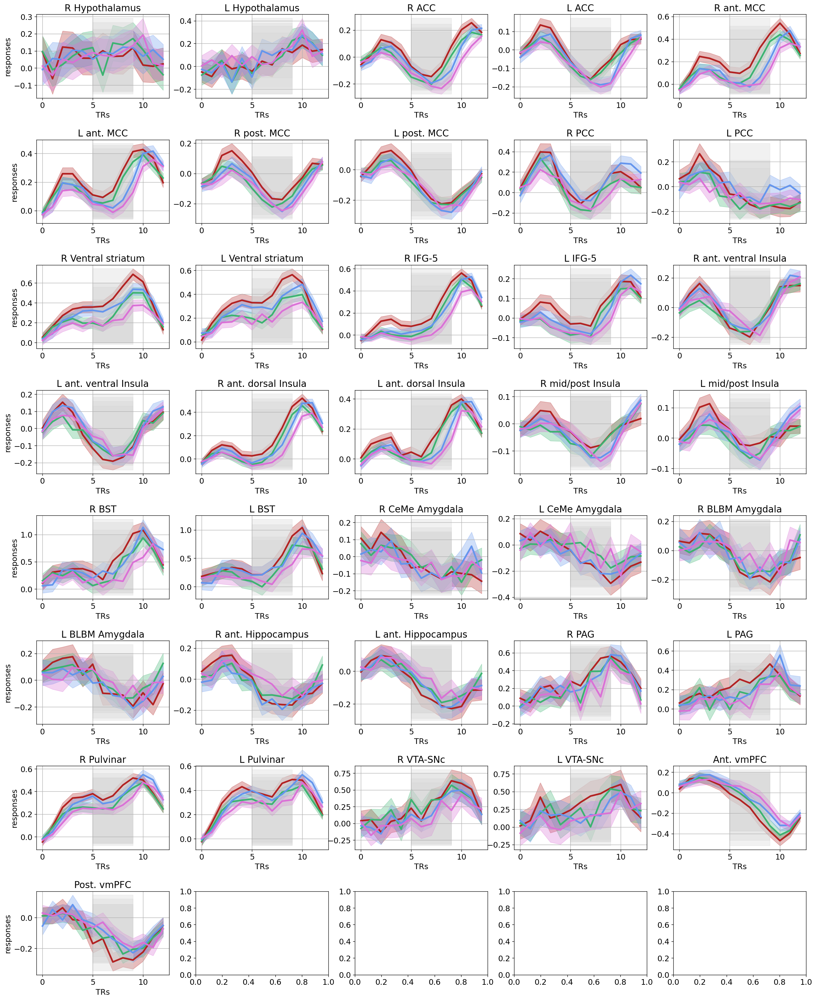

In [17]:
X = dataset_utils.get_aba_trial_level_responses(args)
args.plot_colors = {
    'high_Threat': 'firebrick', 'low_Threat': 'mediumseagreen', 
    'high_Reward': 'cornflowerblue', 'low_Reward': 'orchid'
}
dataset_utils.plot_aba_responses(args, X)

## Emoprox2 dataset

In [18]:
class ARGS(): pass
args = ARGS()

args.SEED = 74
np.random.seed(args.SEED)

args.APPR = 1
args.RETR = -1
args.LABELS = [args.APPR, args.RETR]
args.LABEL_NAMES = ['APPR', 'RETR']
args.NAMES = ['APPR', 'RETR']
args.TRIAL_LEN = {name:None for name in args.LABEL_NAMES}
args.near_miss_thresh = 0.7
args.near_miss_width = 8
args.hemo_lag = 4
args.TR = 1.25

### Mashid ROIs

[13 12 12  8]
[13 25 37]
[ 7 19 31 41]
['Salience' 'Executive' 'Task negative' 'Subcortical']


  0%|          | 0/30 [00:00<?, ?it/s]

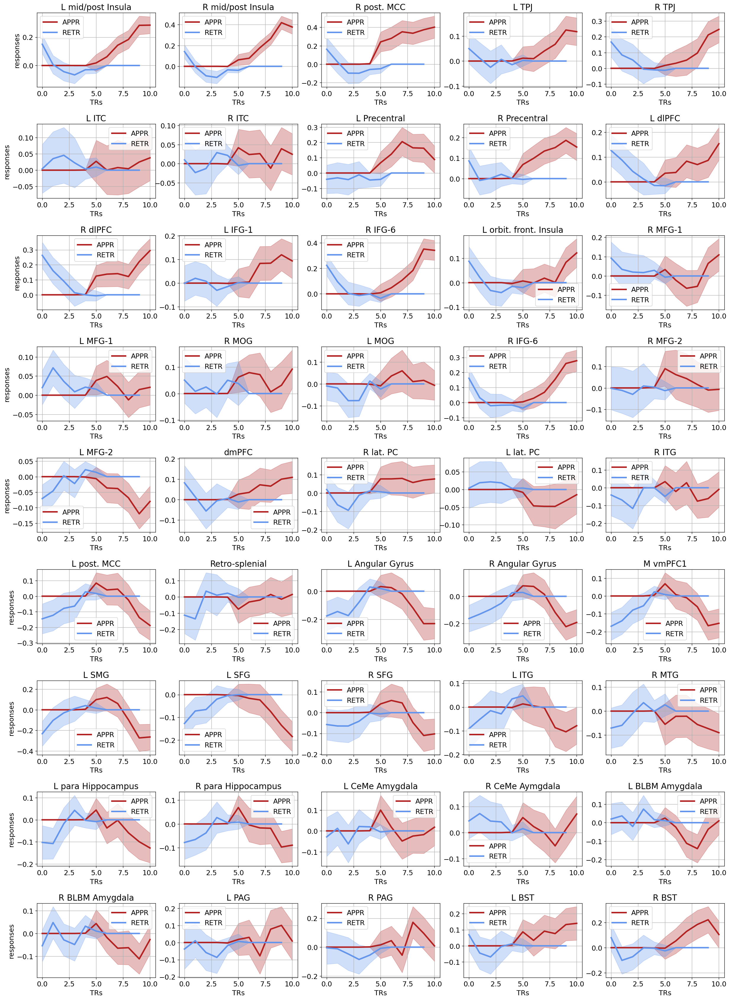

In [19]:
with open(
    f"/home/joyneelm/FORAGING/local/notebooks/dynamical_systems_emoprox/emoprox_motion_parameters.pkl", 
    'rb'
) as f:
    motion_df = pickle.load(f)
# motion_df

args.roi_set_name = 'mashid'
args.main_data_dir = (
    f"{proj_dir}/data/emoprox2/data/rois_{args.roi_set_name}"
)
# exploratory data
args.subjects = np.unique(motion_df.pid.values)
random.Random(args.SEED).shuffle(args.subjects)
args.explor_subjects = args.subjects[ : round(0.25 * len(args.subjects))]

# ROIs
args = get_mashid_rois(args)
args = get_mashid_plot_tick_labels(args)

# condition responses
X = dataset_utils.get_emo2_trial_level_responses(args, motion_df)
args.plot_colors = {'APPR': 'firebrick', 'RETR': 'cornflowerblue'}
dataset_utils.plot_emo2_responses(args, X)

#### FCs

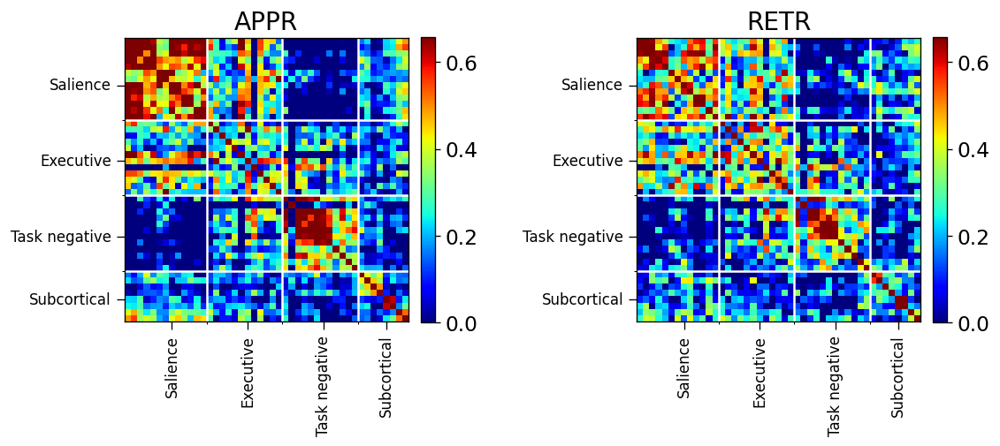

In [21]:
ts = dataset_utils.get_emo2_block_time_series(args, X)
fcs, summary_fcs = dataset_utils.get_fcs(args, ts)
dataset_utils.plot_emo2_fcs(args, summary_fcs, cmap=mpl.colormaps['jet'])